In [1]:
import json
import numpy as np
import glob
import os
import anndata

import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import pandas as pd
import json

from sklearn.metrics import pairwise_distances

import importlib

from dredFISH.Utils.__init__plots import *
from dredFISH.Utils import basicu 
from dredFISH.Utils.miscu import order_by_hc
from dredFISH.Utils import designu

# from dredFISH.Design.model_v2p2_gene_constraints import CellTypeNet
from dredFISH.Design import data_loader_scrna 

config = importlib.import_module("dredfish_processing_config")

importlib.reload(data_loader_scrna)
importlib.reload(designu)

<module 'dredFISH.Utils.designu' from '/bigstore/GeneralStorage/fangming/projects/dredfish/packages/dredFISH/dredFISH/Utils/designu.py'>

In [2]:
class InstNrm(nn.Module):
    """
    Performs normalization on projection with thresholding by value  
    
    Attributes
    ----------
        min_pos: minimum position  
        min_sgnl: minimum signal
        max_sgnl: maximum signal
        scale: scaling factors
        noise: range of noises for Poisson parameter
    """
    def __init__(self, min_pos= 1e5, min_sgnl=5e4, max_sgnl= 2.5e5, scale= 1.5e4, noise= (1e4, 1e3)):
        super().__init__()
        self.scale= torch.tensor(scale).log()
        self.noise= noise
        self.median= torch.tensor(min_pos) # median intensity -- as each cell has half +; it is the "minimum pos" as well 
        self.min_sgnl= torch.tensor(min_sgnl)
        self.max_sgnl= torch.tensor(max_sgnl)

    def forward(self, X):
        """
        Forward propagation with Poisson noise added
        
        Attributes
        ----------
        X: (projected) gene count matrix
        
        Returns
        -------
        (X1-l)/self.scale: standardized input
        lower + upper + median: quartile error 
        """
        
        # Poisson noise
        if self.noise is None:
            X1= X.log()
        else:
            X1= (X + torch.poisson(self.noise[0]*torch.ones_like(X) + self.noise[1]*torch.randn_like(X))).log()
        # each coarse level cell type will have a median expression value, which is the difference between the last low value
        # and the first high value 
        o= X1.sort(1)[0] # sort by bits (by col). [0] - val; [1] - indices
        a= o[:,:o.shape[1]//2] # smaller half
        b= o[:,o.shape[1]//2:] # bigger half
        l= (a[:,-1:] + b[:,:1])/2 # middle values for each cell
        
        # lower and upper are bounds on expression, we want counts within their threshold
        lower= ((self.min_sgnl - X).clamp(0)**2).mean() # X lower than min
        upper= ((X - self.max_sgnl).clamp(0)**2).mean() # X larger than max
        median= ((self.median - b.exp()).clamp(0)**2).mean() # larger half lower than median  
        return (X1-l)/self.scale, lower + upper + median

In [3]:
def normalize_w_v2(W, cnstrnts, num_tp=90000):
    """Normalize the matrix W from DPNMF
    - scale 
    - integerize
    - cap probe constraints
    - remove genes with no weights
    
    arguments:
    - W: DataFrame
    """
    assert len(W) == len(cnstrnts)
    
    # scale
    Wn = W/(W.sum().sum())*num_tp
    # integerize 
    Wn = (Wn+0.5).astype(int)
    # # constraints
    # for col in Wn:
    #     Wn[col] = np.clip(Wn[col], None, cnstrnts)
        
    # constraints (total counts of a gene across 24 basis has limit)
    cnstrnts_scale = np.clip(Wn.sum(axis=1)/cnstrnts, 1, None).values # at least 1; maybe >1 
    Wn = Wn/cnstrnts_scale.reshape(-1,1)
    Wn = Wn.fillna(0).astype(int) # NaN means cnstrnts == 0
        
    # remove genes with no weights
    nonzero_cond = Wn.sum(axis=1)>0  
    
    Wn_slim = Wn.loc[nonzero_cond]
    
    print(f"Total num probes: {Wn.sum().sum():,}")
    print(f"Total num genes: {nonzero_cond.sum():,}")
    return Wn, Wn_slim, nonzero_cond

In [4]:
def proc_pmat(pmat, ftrs_all, genes_idx, clsts, _drows=None):
    """
    """
    prx = torch.from_numpy(pmat.values).float()
    
    ftrs = basicu.libsize_norm(ftrs_all, scale=1e6)
    ftrs = ftrs[:,genes_idx] 
    prjx = ftrs.mm(prx)
    # if option == 'dpnmf':
    embx = prjx #/torch.reshape(prjx.sum(1), (-1,1)) #+1
    # else:
    #     embx = np.log10(prjx+1)
        
    # elif option == 'igor':
    #     embx, _reg = nrmNN.forward(prjx)

    prjx = prjx.numpy()
    embx = embx.numpy()
    print(prjx.shape, embx.shape, clsts.shape)

    nzero_prbe_cond = pmat.sum(axis=1) > 0
    pospmat = pmat[nzero_prbe_cond]
    fpmat = pospmat.divide(pospmat.sum(axis=0), axis=1)
    print(pospmat.shape, fpmat.shape)

    prjx_clsts, _ = basicu.group_mean(prjx, clsts)
    embx_clsts, _ = basicu.group_mean(embx, clsts)
    embx_clsts_z  = basicu.zscore(embx_clsts, allow_nan=True, axis=0)
    embx_clsts_corr = np.corrcoef(embx_clsts_z)

    # order by HC
    _rows = order_by_hc(embx_clsts)
    _cols = order_by_hc(embx_clsts.T)
    
    # order to emphasize diagonal elements (columns) (take quite long)
    _, _, _dcols = basicu.diag_matrix_cols(embx_clsts_z[_drows,:]) # this takes quite long
    
    return fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols

In [5]:
device = torch.device('cpu')
torch.manual_seed(0) # reproduciability

In [6]:
for i, bit in enumerate(config.bitmap):
    print(i, bit)

0 ('RS0109_cy5', 'hybe2', 'FarRed')
1 ('RS0175_cy5', 'hybe3', 'FarRed')
2 ('RS0237_cy5', 'hybe4', 'FarRed')
3 ('RS0307_cy5', 'hybe5', 'FarRed')
4 ('RS0332_cy5', 'hybe6', 'FarRed')
5 ('RS0384_atto565', 'hybe10', 'FarRed')
6 ('RS0406_atto565', 'hybe11', 'FarRed')
7 ('RS0451_atto565', 'hybe12', 'FarRed')
8 ('RS0468_atto565', 'hybe13', 'FarRed')
9 ('RS0548_atto565', 'hybe14', 'FarRed')
10 ('RS64.0_atto565', 'hybe15', 'FarRed')
11 ('RS156.0_alexa488', 'hybe19', 'FarRed')
12 ('RS278.0_alexa488', 'hybe20', 'FarRed')
13 ('RS313.0_alexa488', 'hybe21', 'FarRed')
14 ('RS643.0_alexa488', 'hybe22', 'FarRed')
15 ('RS740.0_alexa488', 'hybe23', 'FarRed')
16 ('RS810.0_alexa488', 'hybe24', 'FarRed')
17 ('RSN9927.0_cy5', 'hybe7', 'FarRed')
18 ('RSN2336.0_cy5', 'hybe8', 'FarRed')
19 ('RSN1807.0_cy5', 'hybe9', 'FarRed')
20 ('RSN4287.0_atto565', 'hybe16', 'FarRed')
21 ('RSN1252.0_atto565', 'hybe17', 'FarRed')
22 ('RSN9535.0_atto565', 'hybe18', 'FarRed')
23 ('RS0095_cy5', 'hybe1', 'FarRed')
24 ('PolyT', 'hyb

In [7]:
pmat_cols = [bit[0].split('_')[0] for bit in config.bitmap[:24]]
pmat_cols

['RS0109',
 'RS0175',
 'RS0237',
 'RS0307',
 'RS0332',
 'RS0384',
 'RS0406',
 'RS0451',
 'RS0468',
 'RS0548',
 'RS64.0',
 'RS156.0',
 'RS278.0',
 'RS313.0',
 'RS643.0',
 'RS740.0',
 'RS810.0',
 'RSN9927.0',
 'RSN2336.0',
 'RSN1807.0',
 'RSN4287.0',
 'RSN1252.0',
 'RSN9535.0',
 'RS0095']

In [8]:
# the dataset
trn_dataloader = data_loader_scrna.load_Allen_data(
    datasetkey='smrt_trn', 
    keyX='counts', keyY='l3_code', keyYcat='l3_cat', 
    batch_size=64,
)
tst_dataloader = data_loader_scrna.load_Allen_data(
    datasetkey='smrt_tst', 
    keyX='counts', keyY='l3_code', keyYcat='l3_cat', 
    batch_size=5000,
)
f = os.path.join('/bigstore/GeneralStorage/fangming/projects/dredfish/data/', 'rna', 'gidx_cnstrnts_pshop_mm10_isoflat.pt')
cnstrnts_idx = torch.load(f)
f = os.path.join('/bigstore/GeneralStorage/fangming/projects/dredfish/data/', 'rna',      'cnstrnts_pshop_mm10_isoflat.pt')
cnstrnts = torch.load(f)

n_gns = len(cnstrnts) # trn_dataloader.dataset.X.shape[1] # number of genes
n_cat = len(trn_dataloader.dataset.Ycat) # number of clusters
genes_data = tst_dataloader.dataset.data['genes'][:] #.Genes
genes_cnst = genes_data[cnstrnts_idx]
print(genes_data.shape, genes_cnst.shape)

(45768,) (23282,)


In [9]:
%%time
# validation dataset
ftrs_all, clsts = next(iter(tst_dataloader))
ftrs_all = ftrs_all.float()#.numpy() # all features
clsts = clsts.long().numpy()

CPU times: user 2min 35s, sys: 33.4 s, total: 3min 8s
Wall time: 28.2 s


In [10]:
# cluster annotation
clst_annots = tst_dataloader.dataset.Ycat[:]
type_orders = clst_annots[np.unique(clsts)]

# analysis metadata
meta_path = '/bigstore/GeneralStorage/fangming/projects/dredfish/data_dump/analysis_meta_Mar31.json'
with open(meta_path, 'r') as fh:
    meta = json.load(fh)
l3clst_order = np.array(meta['l3_clsts']) # get cluster order

_rows_l3clsts = basicu.get_index_from_array(type_orders, l3clst_order)

l3clst_order.shape, type_orders.shape, _rows_l3clsts

((42,),
 (42,),
 array([34, 38, 39, 41, 37, 28, 29, 11, 17, 18, 24,  6, 10,  9, 12, 13, 14,
        15, 21, 25, 23,  5, 26, 27, 22, 31, 32, 16, 19, 20, 36,  1,  2,  3,
         7,  4,  0,  8, 30, 35, 40, 33]))

In [11]:
# get the NN genes and constraints (for DPNMF design)
f = '/bigstore/binfo/mouse/Brain/DRedFISH/Allen_V3_Reference/10X/genes.npy' 
nngenes = np.load(f)
f = '/bigstore/binfo/mouse/Brain/DRedFISH/Allen_V3_Reference/10X/probe_constraints.npy'
nngene_cnstrnts = np.load(f)
assert len(nngene_cnstrnts) == len(nngenes)
print(nngene_cnstrnts.shape)

(10861,)


In [12]:
# get new set genes and constraints
# f = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/pshop_smart_l5n100_cpm1_genes.txt' 
f = '/bigstore/GeneralStorage/fangming/projects/dredfish/data/rna/pshop_smart_full_cpm1_genes_13k_oct13_2022.txt' 
newgenes = np.loadtxt(f, dtype=str)
newgene_cnstrnts = cnstrnts[basicu.get_index_from_array(genes_cnst, newgenes)].numpy()
newgenes.shape, newgene_cnstrnts.shape

((13489,), (13489,))

In [13]:
all_ws = {}
all_pmats = {}
all_genes = {}
all_gidxs = {}
all_used = {}
all_alwd = {}
nrmNN = InstNrm()

In [14]:
# DPNMF probe set
f = "/bigstore/GeneralStorage/fangming/projects/dredfish/data/dpnmf.csv"
pmat = pd.read_csv(f, index_col=0) # [pmat_cols]
pmat = pmat[pmat.sum(axis=1)>0]
pmat.columns = [col.split("_")[0] for col in pmat.columns]
assert np.all(pmat_cols == pmat.columns.values)
genes = pmat.index.values
print(pmat.shape, genes.shape)

# select only those existed in data
genes_comm = np.intersect1d(genes, genes_data)
genes = genes_comm
genes_idx = basicu.get_index_from_array(genes_data, genes)
pmat = pmat.loc[genes_comm]
print(pmat.shape, genes.shape, genes_idx.shape)

genes_withcnst = np.intersect1d(genes, genes_cnst)
used = pmat.loc[genes_withcnst].sum(axis=1).values
allowed = cnstrnts[basicu.get_index_from_array(cnstrnts_idx, basicu.get_index_from_array(genes_data, genes_withcnst))].numpy()
print(genes_withcnst.shape, used.shape, allowed.shape)

meth = 'DPNMF orig'
all_ws[meth] = ''
all_pmats[meth] = pmat
all_genes[meth] = genes
all_gidxs[meth] = genes_idx
all_used[meth] = used
all_alwd[meth] = allowed

# extra thing
genes_orig_dpnmf_positive = genes

(5818, 24) (5818,)
(5576, 24) (5576,) (5576,)
(5441,) (5441,) (5441,)


In [15]:
# new DPNMF designs
fs = [
    f'/bigstore/GeneralStorage/fangming/projects/dredfish/res_dpnmf/v_python/smrt_X_DPNMF_tree_oct13set_v2.h5ad', 
]

for f in fs:
    adata = anndata.read(f)
    mus = [float(key[len('w_mu'):]) for key in adata.layers.keys()]
    # mus = [0, 1e2, 1e4, 1e6,]
    for mu in mus:
        label = f'w_mu{mu:.1e}'
        meth = f'DPNMF tree v2 {mu:.1e}'
        print(meth)

        W = adata.layers[label]
        W = pd.DataFrame(W)

        pmat, _, _ = normalize_w_v2(W, newgene_cnstrnts, num_tp=90000)
        pmat.index = newgenes
        pmat.columns = pmat_cols

        pmat = pmat[pmat.sum(axis=1)>0]
        assert np.all(pmat_cols == pmat.columns.values)
        genes = pmat.index.values
        # print(pmat.shape, genes.shape)

        # select only those existed in data
        genes_comm = np.intersect1d(genes, genes_data)
        genes = genes_comm
        genes_idx = basicu.get_index_from_array(genes_data, genes)
        pmat = pmat.loc[genes_comm]
        # print(pmat.shape, genes.shape, genes_idx.shape)

        genes_withcnst = np.intersect1d(genes, genes_cnst)
        used = pmat.loc[genes_withcnst].sum(axis=1).values
        allowed = cnstrnts[basicu.get_index_from_array(cnstrnts_idx, basicu.get_index_from_array(genes_data, genes_withcnst))].numpy()
        # print(genes_withcnst.shape, used.shape, allowed.shape)

        # meth = 'DPNMF pca'
        all_ws[meth] = W
        all_pmats[meth] = pmat
        all_genes[meth] = genes
        all_gidxs[meth] = genes_idx
        all_used[meth] = used
        all_alwd[meth] = allowed

DPNMF tree v2 0.0e+00
Total num probes: 65,376
Total num genes: 10,450
DPNMF tree v2 1.0e+02
Total num probes: 65,941
Total num genes: 10,551
DPNMF tree v2 1.0e+03
Total num probes: 68,222
Total num genes: 10,856
DPNMF tree v2 1.0e+04
Total num probes: 64,113
Total num genes: 10,330
DPNMF tree v2 1.0e+05
Total num probes: 46,753
Total num genes: 6,030
DPNMF tree v2 1.0e+06
Total num probes: 42,484
Total num genes: 4,958
DPNMF tree v2 2.0e+02
Total num probes: 66,629
Total num genes: 10,697
DPNMF tree v2 2.0e+03
Total num probes: 65,869
Total num genes: 10,424
DPNMF tree v2 2.0e+04
Total num probes: 61,263
Total num genes: 9,858
DPNMF tree v2 2.0e+05
Total num probes: 46,875
Total num genes: 5,724
DPNMF tree v2 5.0e+02
Total num probes: 66,714
Total num genes: 10,565
DPNMF tree v2 5.0e+03
Total num probes: 65,076
Total num genes: 10,599
DPNMF tree v2 5.0e+04
Total num probes: 51,538
Total num genes: 7,485
DPNMF tree v2 5.0e+05
Total num probes: 44,630
Total num genes: 5,145


# Compare

In [16]:
def plot_intn_v2(prjx, meth, color, ax1, ax2):
    """
    # intensity across bits
    """
    prjx_medbits = np.median(prjx, axis=0)
    prjx_q10bits = np.percentile(prjx, 10, axis=0)
    prjx_q90bits = np.percentile(prjx, 90, axis=0)
    # prjx_q01bits = np.percentile(prjx, 1 , axis=0)
    # prjx_q99bits = np.percentile(prjx, 99, axis=0)
    order = np.argsort(prjx_medbits)[::-1]
    
    n = len(prjx_medbits)
    
    ax = ax1
    ax.plot(np.arange(n), prjx_medbits[order], '-', label=meth, color=color)
    ax.fill_between(np.arange(n), 
                    y1=prjx_q10bits[order], 
                    y2=prjx_q90bits[order], 
                    edgecolor='none',
                    alpha=0.5,
                    color=color,
                   )

    ax.set_title('10,50,90 percentiles')
    ax.set_yscale('log')
    ax.set_ylabel('Intensity')
    sns.despine(ax=ax)

    ax = ax2
    # ax.plot(np.arange(n), np.log2((prjx_q90bits[order]+1)/(prjx_q10bits[order]+1)), '-', label=meth, color=color)
    ax.plot(np.arange(n), (prjx_q90bits[order]+1)/(prjx_q10bits[order]+1), '-', label=meth, color=color)
    # ax.set_ylim(ymin=0)
    ax.set_yscale('log')
    ax.set_ylabel('FC 90%/10%')
    ax.legend(bbox_to_anchor=(1,1))
    sns.despine(ax=ax)
    ax.set_ylim(ymax=100)
    # ax.set_xticks(np.arange(n)) 
    # ax.set_xticklabels(order, rotation=90)
    return

In [17]:
palette = sns.color_palette('tab20', len(all_pmats.keys()))
palette

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745)]

In [20]:
# methods = list(all_pmats.keys())
mus_all = np.sort([float(meth[len('DPNMF tree v1 '):]) 
                   for meth in all_pmats.keys() 
                   if meth.startswith('DPNMF tree')
                  ])
print(mus_all)

methods = ['DPNMF orig'] + [f"DPNMF tree v2 {mu:.1e}" for mu in mus_all]
print(methods)
colors = palette[:len(methods)]

[0.e+00 1.e+02 2.e+02 5.e+02 1.e+03 2.e+03 5.e+03 1.e+04 2.e+04 5.e+04
 1.e+05 2.e+05 5.e+05 1.e+06]
['DPNMF orig', 'DPNMF tree v2 0.0e+00', 'DPNMF tree v2 1.0e+02', 'DPNMF tree v2 2.0e+02', 'DPNMF tree v2 5.0e+02', 'DPNMF tree v2 1.0e+03', 'DPNMF tree v2 2.0e+03', 'DPNMF tree v2 5.0e+03', 'DPNMF tree v2 1.0e+04', 'DPNMF tree v2 2.0e+04', 'DPNMF tree v2 5.0e+04', 'DPNMF tree v2 1.0e+05', 'DPNMF tree v2 2.0e+05', 'DPNMF tree v2 5.0e+05', 'DPNMF tree v2 1.0e+06']


In [21]:
all_res = {}
for meth in methods:
    pmat = all_pmats[meth]
    genes_idx = all_gidxs[meth]
    
    (fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, 
     _rows, _cols, _dcols) = proc_pmat(pmat, ftrs_all, genes_idx, clsts, 
                               _drows=_rows_l3clsts)
    
    all_res[meth] = fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols

(5000, 24) (5000, 24) (5000,)
(5576, 24) (5576, 24)
(5000, 24) (5000, 24) (5000,)
(10450, 24) (10450, 24)
(5000, 24) (5000, 24) (5000,)
(10551, 24) (10551, 24)
(5000, 24) (5000, 24) (5000,)
(10697, 24) (10697, 24)
(5000, 24) (5000, 24) (5000,)
(10565, 24) (10565, 24)
(5000, 24) (5000, 24) (5000,)
(10856, 24) (10856, 24)
(5000, 24) (5000, 24) (5000,)
(10424, 24) (10424, 24)
(5000, 24) (5000, 24) (5000,)
(10599, 24) (10599, 24)
(5000, 24) (5000, 24) (5000,)
(10330, 24) (10330, 24)
(5000, 24) (5000, 24) (5000,)
(9858, 24) (9858, 24)
(5000, 24) (5000, 24) (5000,)
(7485, 24) (7485, 24)
(5000, 24) (5000, 24) (5000,)
(6030, 24) (6030, 24)
(5000, 24) (5000, 24) (5000,)
(5724, 24) (5724, 24)
(5000, 24) (5000, 24) (5000,)
(5145, 24) (5145, 24)
(5000, 24) (5000, 24) (5000,)
(4958, 24) (4958, 24)


(10465, 24) (10465,)
(10465,)
(10465,)
(10567, 24) (10567,)
(10567,)
(10567,)
(10708, 24) (10708,)
(10708,)
(10708,)
(10579, 24) (10579,)
(10579,)
(10579,)
(10867, 24) (10867,)
(10867,)
(10867,)
(10433, 24) (10433,)
(10433,)
(10433,)
(10607, 24) (10607,)
(10607,)
(10607,)
(10335, 24) (10335,)
(10335,)
(10335,)
(9860, 24) (9860,)
(9860,)
(9860,)
(7488, 24) (7488,)
(7488,)
(7488,)
(6032, 24) (6032,)
(6032,)
(6032,)
(5726, 24) (5726,)
(5726,)
(5726,)
(5148, 24) (5148,)
(5148,)
(5148,)
(4961, 24) (4961,)
(4961,)
(4961,)


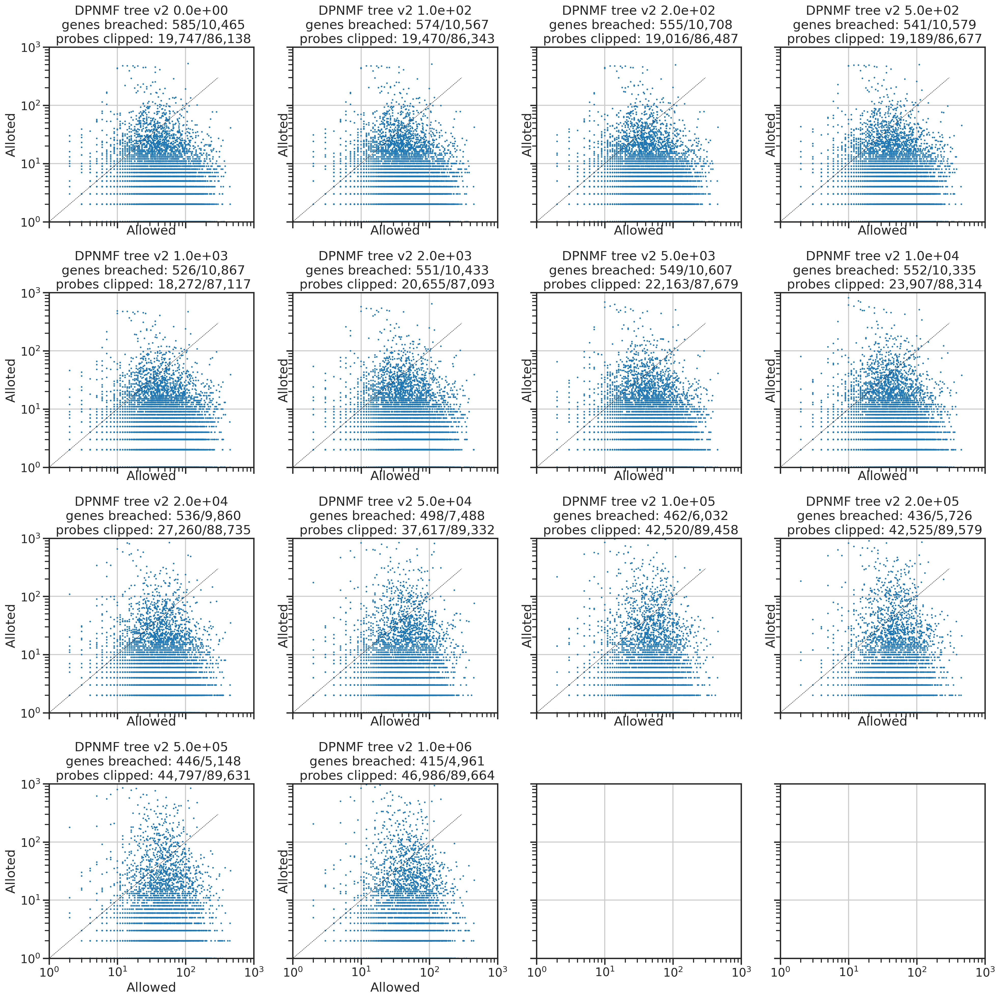

In [22]:
n = len(methods)
nx = 4
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*5,ny*5), sharex=True, sharey=True)
i = 0
for lbl in methods:
    if lbl.startswith('DPNMF tree'):
        # allowed = all_alwd[lbl]
        ax = axs.flat[i]
        i += 1
        
        w = all_ws[lbl]
        genes = newgenes
        w = w.values
        wi = (w*90000/np.sum(w)+0.5).astype(int)
        cond = wi.sum(axis=1)>0
        wi = wi[cond]
        genes = genes[cond]
        print(wi.shape, genes.shape)
        
        genes_withcnst = np.intersect1d(genes, genes_cnst)
        print(genes_withcnst.shape)
        alloted = wi.sum(axis=1) 
        allowed = cnstrnts[basicu.get_index_from_array(cnstrnts_idx, basicu.get_index_from_array(genes_data, genes_withcnst))].numpy()
        print(allowed.shape)
        
        ax.scatter(allowed, alloted, s=5, label=lbl, edgecolor='none')
        nb = (alloted>allowed).sum()
        npb = np.clip(alloted-allowed, 0, None).sum()

        ax.set_title(f'{lbl}\n genes breached: {nb}/{len(genes):,}\n probes clipped: {npb:,}/{np.sum(wi):,}')
        ax.plot([0,300], [0,300], '--k', linewidth=0.5)
        ax.set_xlim([1, 1000])
        ax.set_ylim([1, 1000])
        ax.set_xlabel('Allowed')
        ax.set_ylabel('Alloted')
        ax.set_xscale('log')
        ax.set_yscale('log')
fig.tight_layout()
plt.show()

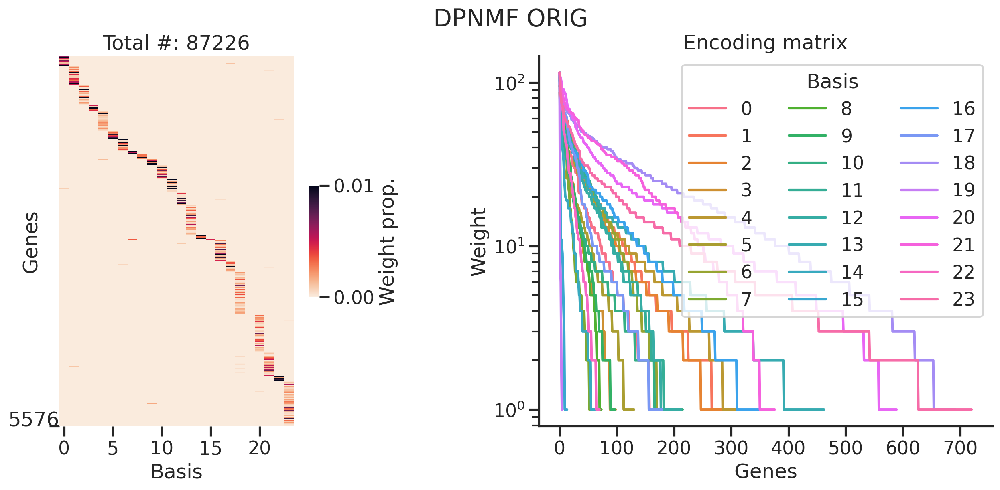

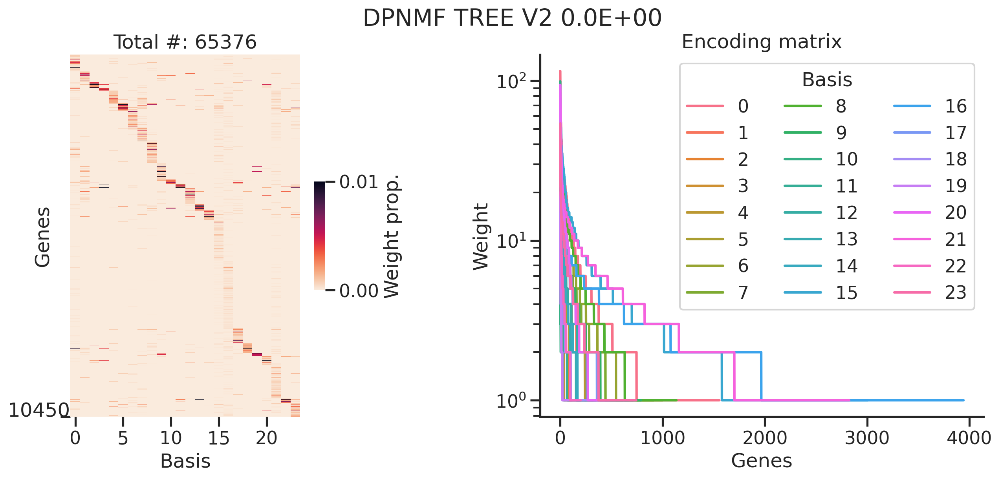

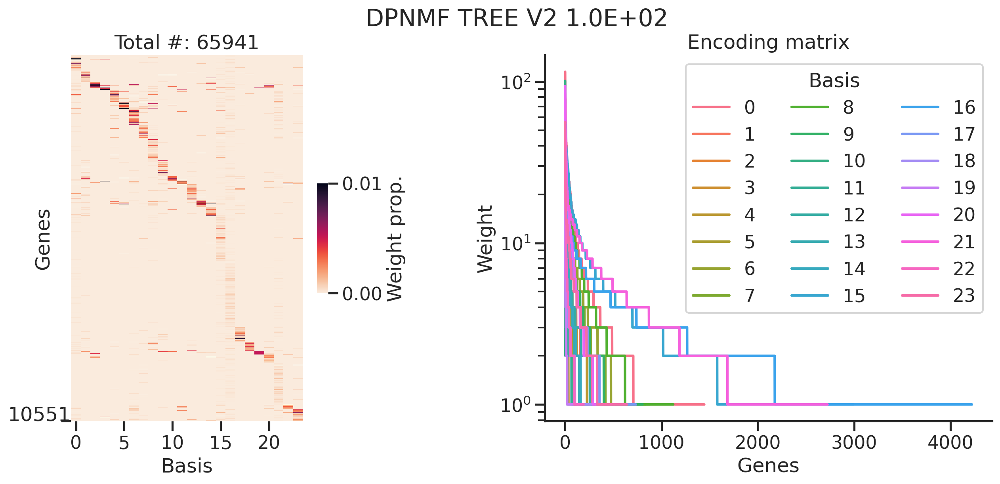

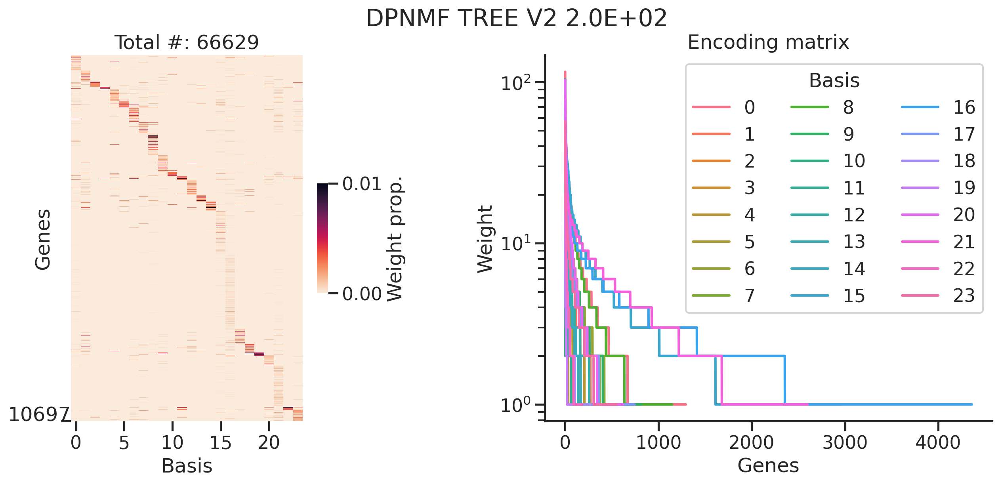

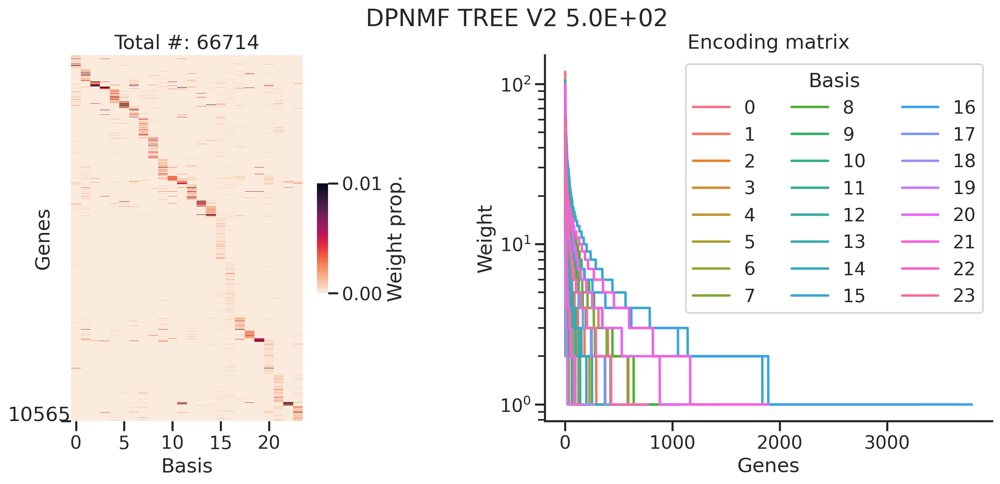

...

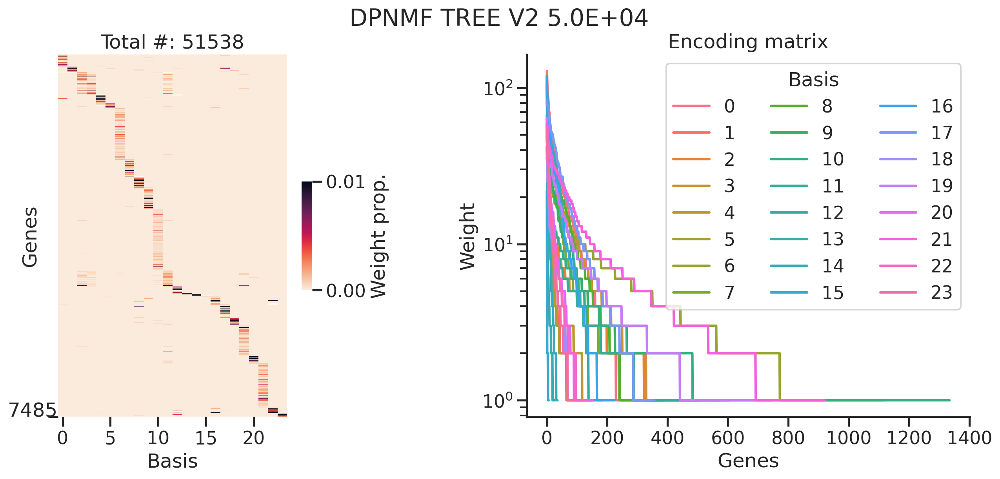

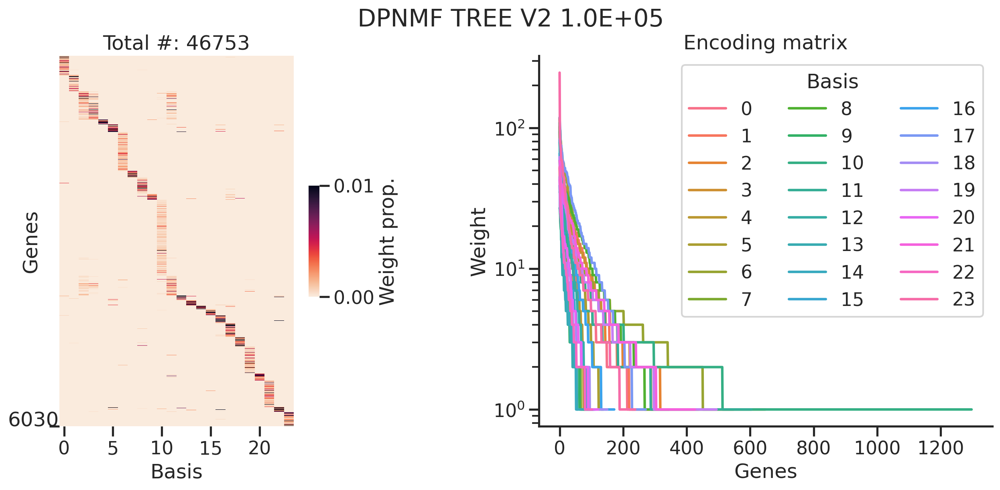

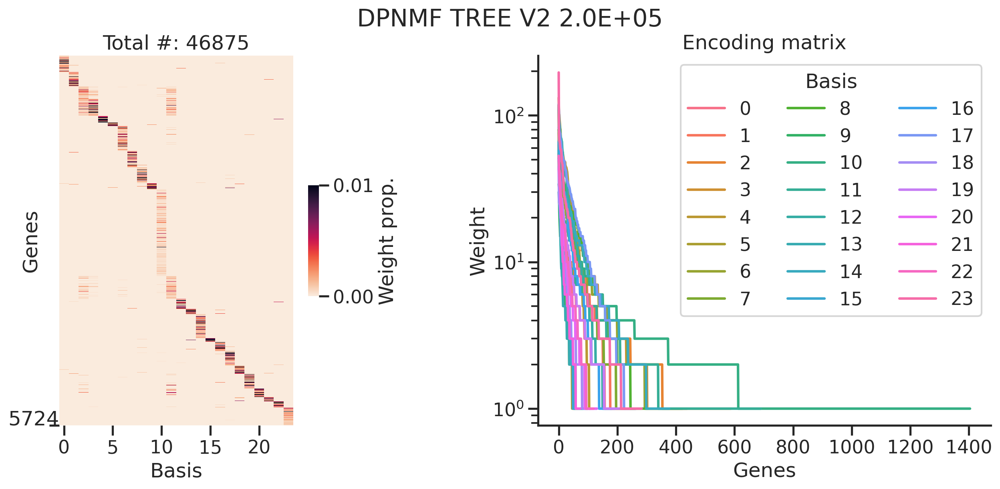

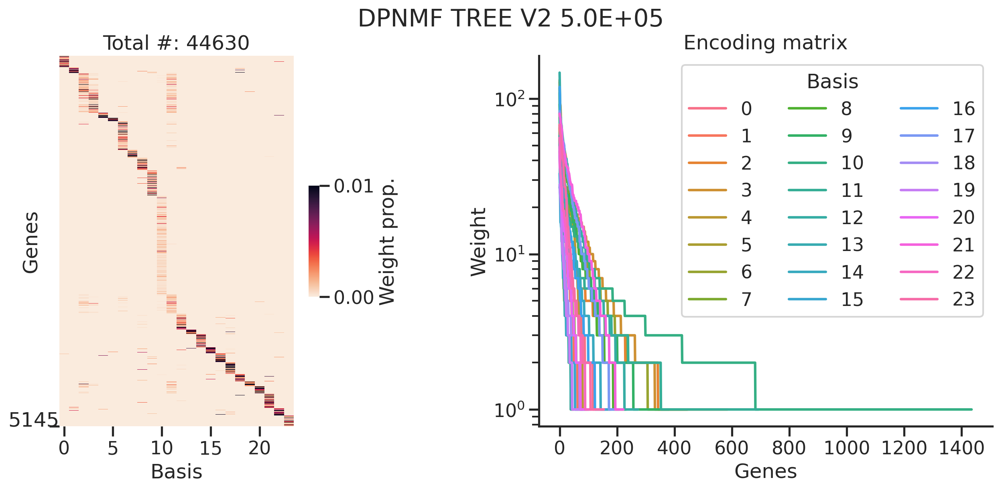

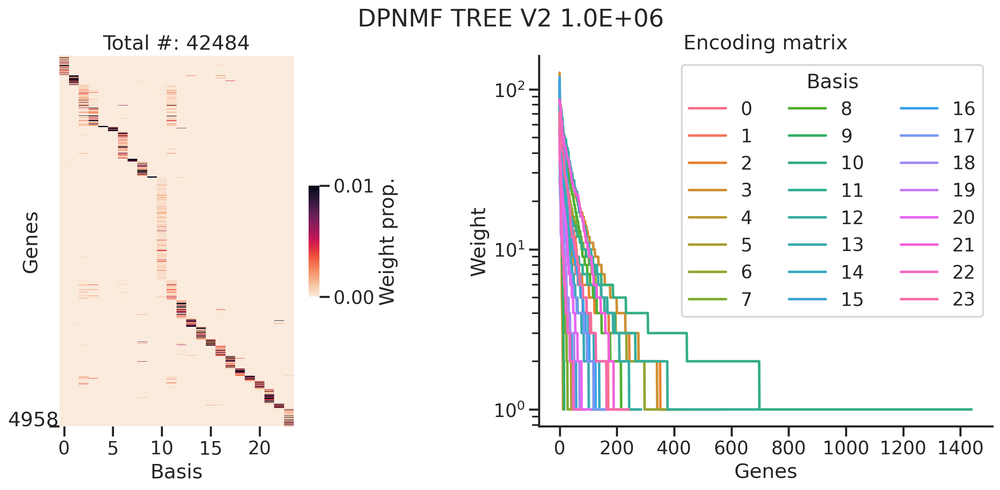

In [23]:
for meth in methods:
    pmat = all_pmats[meth]
    fpmat = all_res[meth][0]
    designu.plot_enc(pmat, fpmat, title=meth.upper())

DPNMF orig
DPNMF tree v2 0.0e+00
DPNMF tree v2 1.0e+02
DPNMF tree v2 2.0e+02
DPNMF tree v2 5.0e+02
DPNMF tree v2 1.0e+03
DPNMF tree v2 2.0e+03
DPNMF tree v2 5.0e+03
DPNMF tree v2 1.0e+04
DPNMF tree v2 2.0e+04
DPNMF tree v2 5.0e+04
DPNMF tree v2 1.0e+05
DPNMF tree v2 2.0e+05
DPNMF tree v2 5.0e+05
DPNMF tree v2 1.0e+06


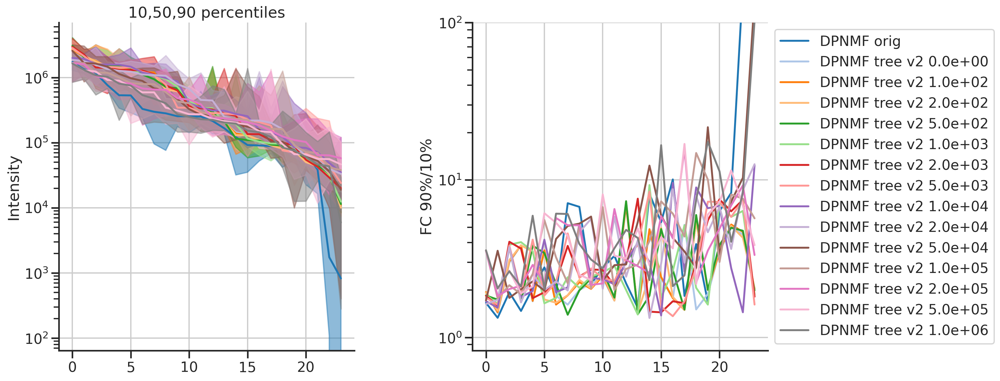

In [24]:
fig, axs = plt.subplots(1, 2, figsize=(15,7))
ax1, ax2 = axs
for i, meth in enumerate(methods):
    print(meth)
    prjx = all_res[meth][1]
    color = colors[i] # f"C{i}"
    plot_intn_v2(prjx, meth, color, ax1, ax2)
fig.subplots_adjust(wspace=0.4)
plt.show()

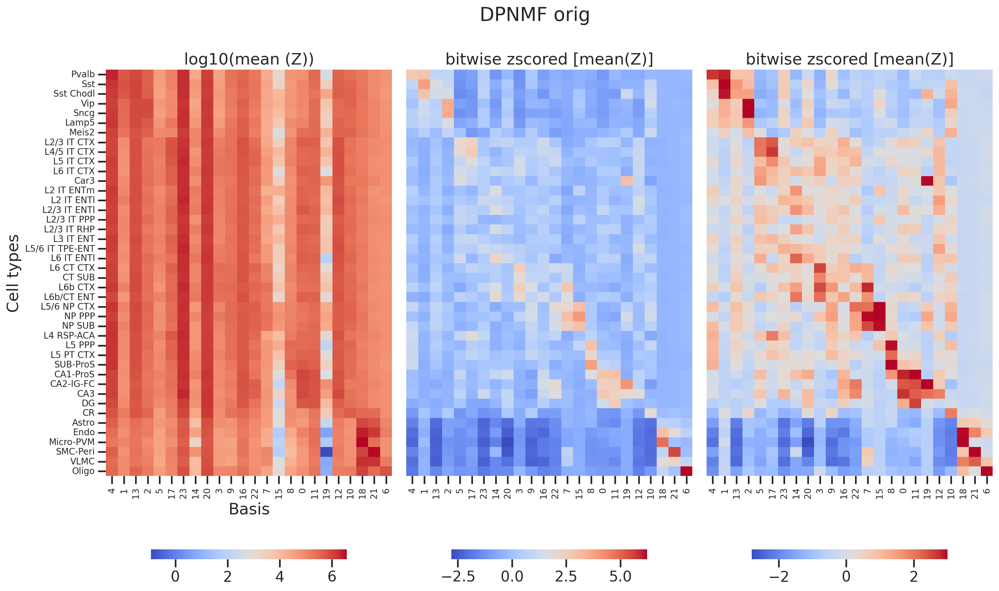

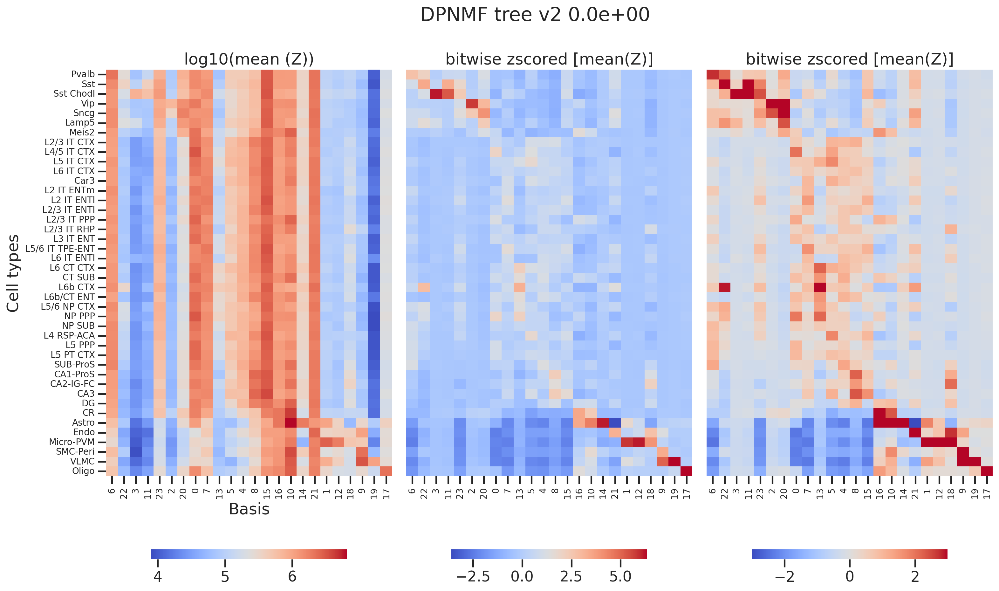

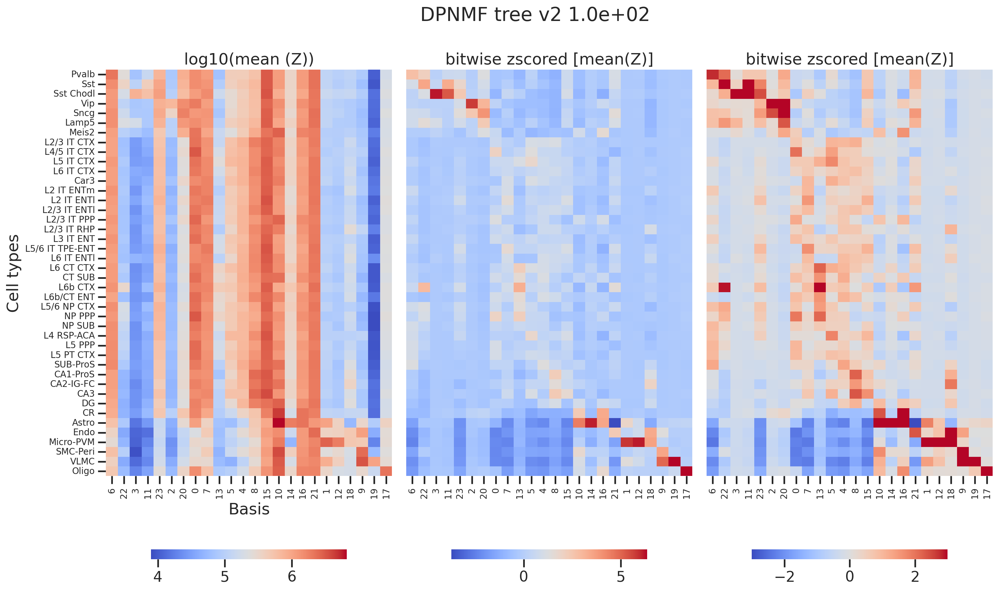

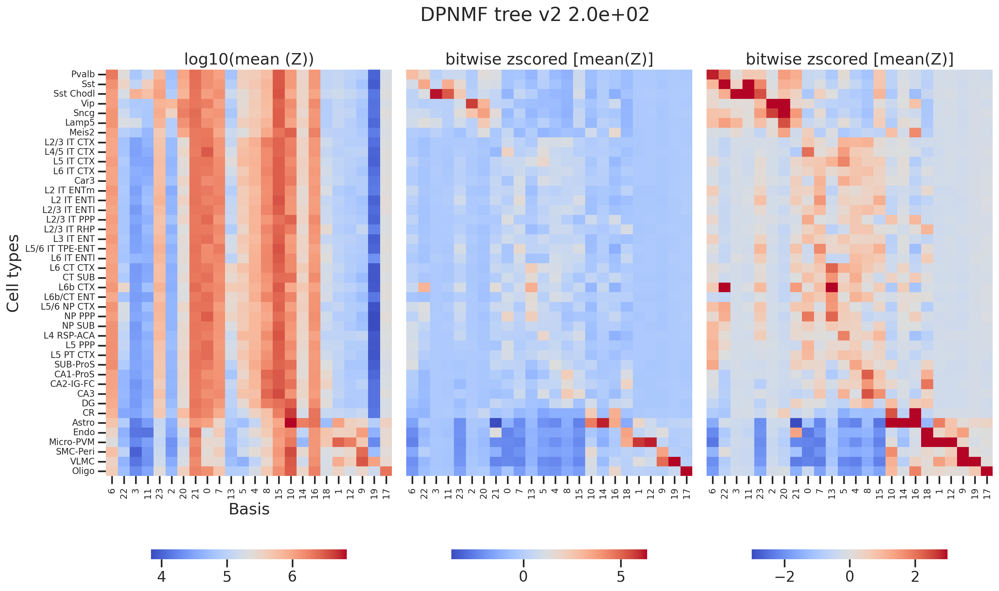

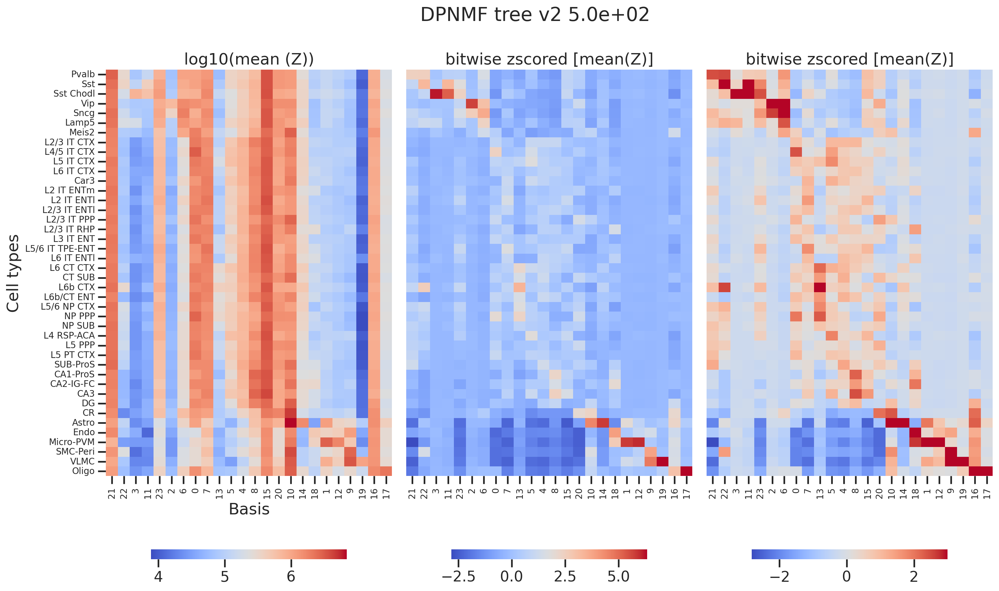

...

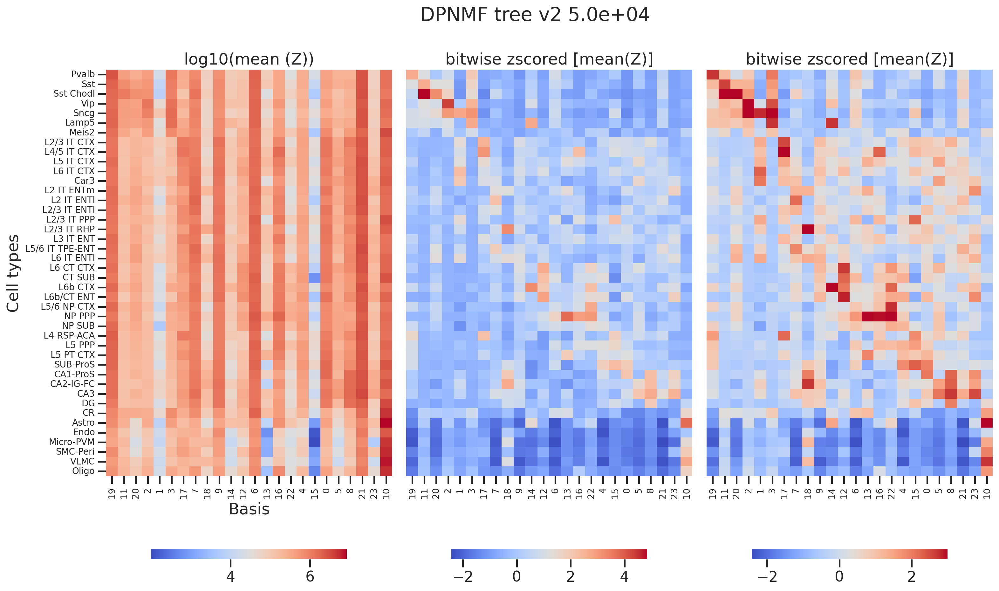

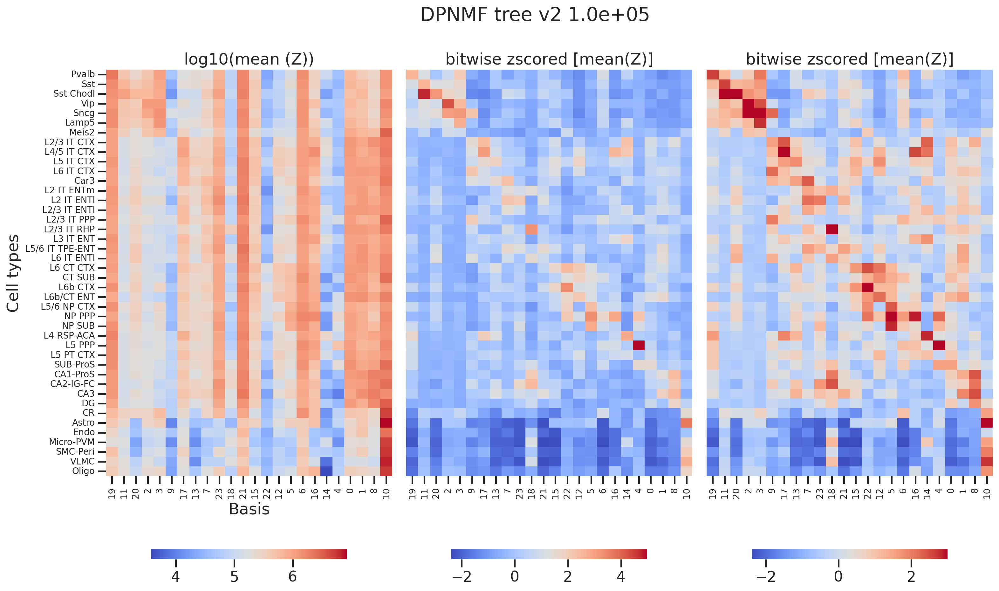

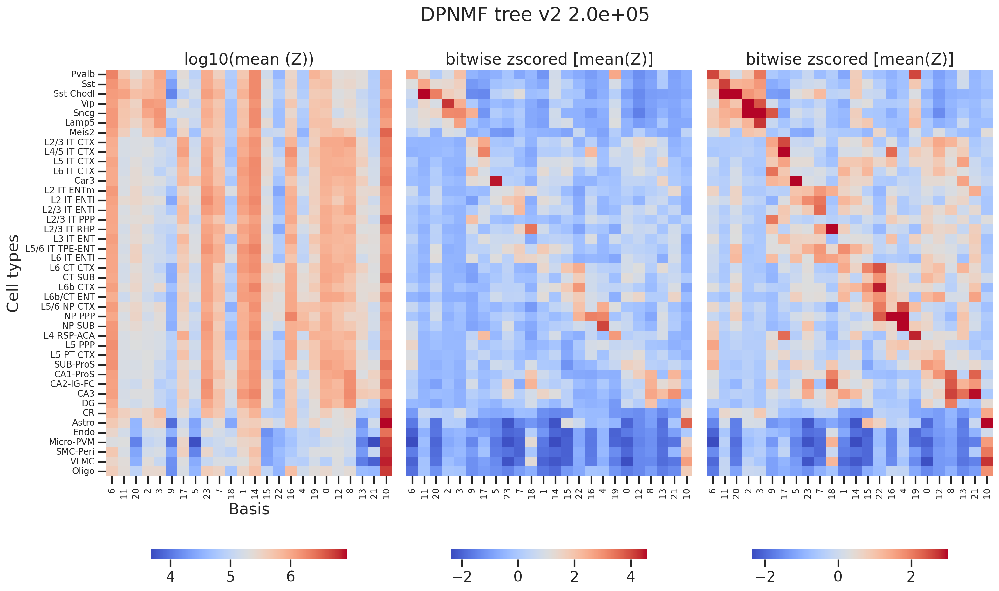

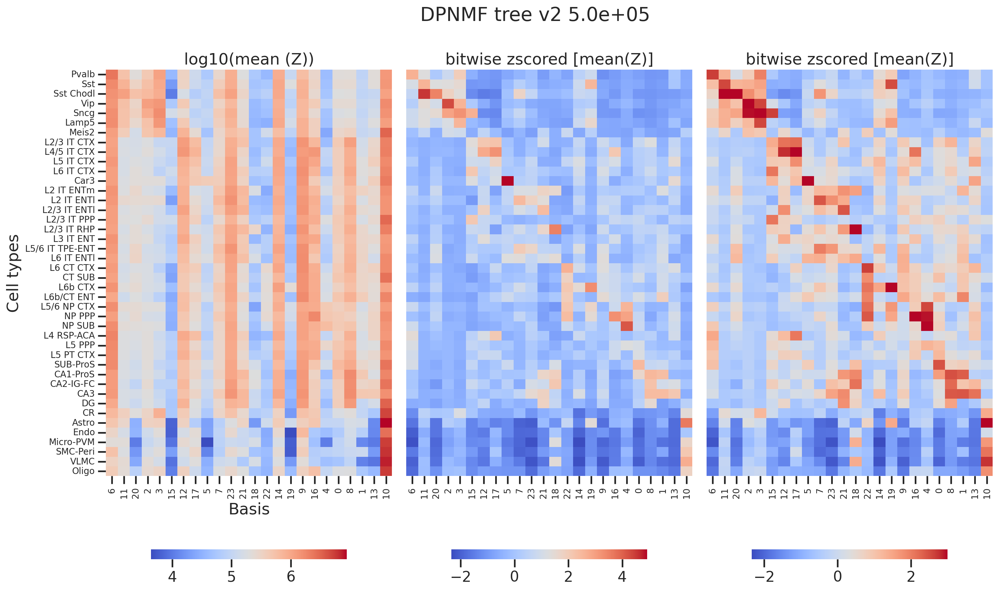

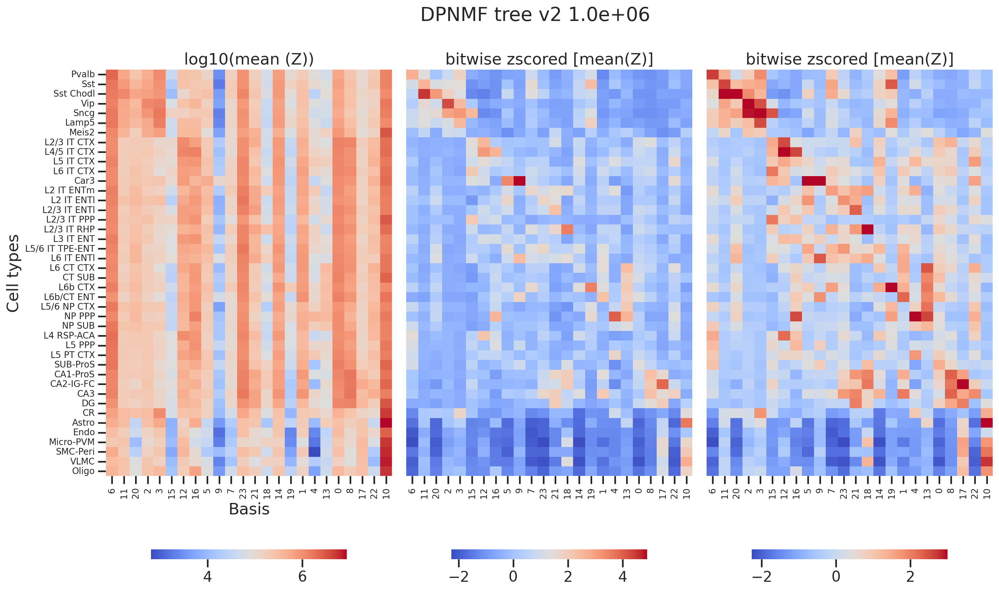

In [25]:
# diagnal ordering
for meth in methods:
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols, = all_res[meth] 
    designu.plot_embx_clsts(prjx_clsts, embx_clsts_z, embx_clsts_z, 
                            rownames=type_orders, # before rearange 
                            colnames=np.arange(24), # before rearange
                            _rows=_rows_l3clsts, # how to rearange
                            _cols=_dcols, #_dcols, #None, 
                            title=meth,
                            figsize=(3*6, 1*10),
                            title2='bitwise zscored [mean(Z)]',
                            title3='bitwise zscored [mean(Z)]',
                           )

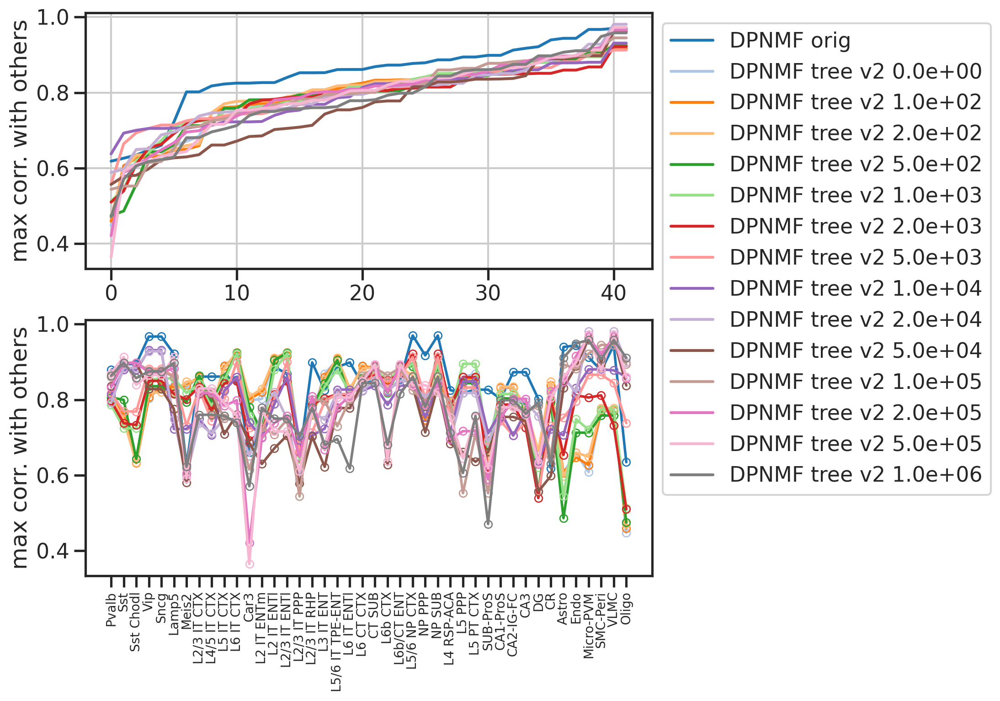

In [26]:
fig, axs = plt.subplots(2,1,figsize=(1*8,2*4))
for i, meth in enumerate(methods):
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    corrmat = embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts]
    
    # corr mat
    ax = axs[0]
    ax.plot(np.sort(np.sort(corrmat, axis=0)[-2]), label=meth, color=colors[i])
    
    ax = axs[1]
    ax.plot(np.sort(corrmat, axis=0)[-2], '-o', label=meth, markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    ax.set_xticks(np.arange(len(corrmat)))
    ax.set_xticklabels(l3clst_order, rotation=90, fontsize=10)
    ax.grid(False)
    
axs[0].legend(bbox_to_anchor=(1,1))
axs[0].set_ylabel('max corr. with others')
axs[1].set_ylabel('max corr. with others')
plt.show()

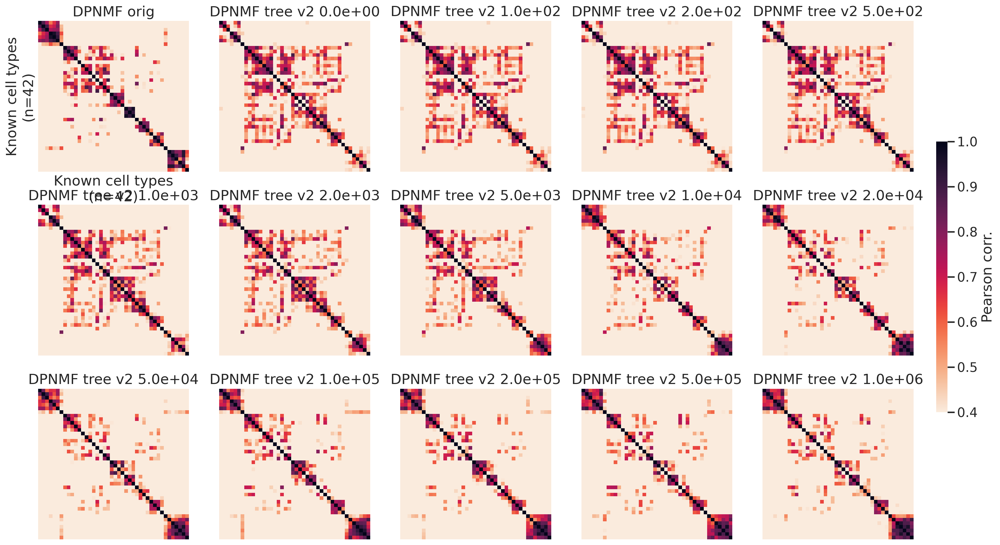

In [27]:
# DPNMF tree
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        vmin=0.4, 
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
    )

In [28]:
dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
distmat.shape

(42, 42)

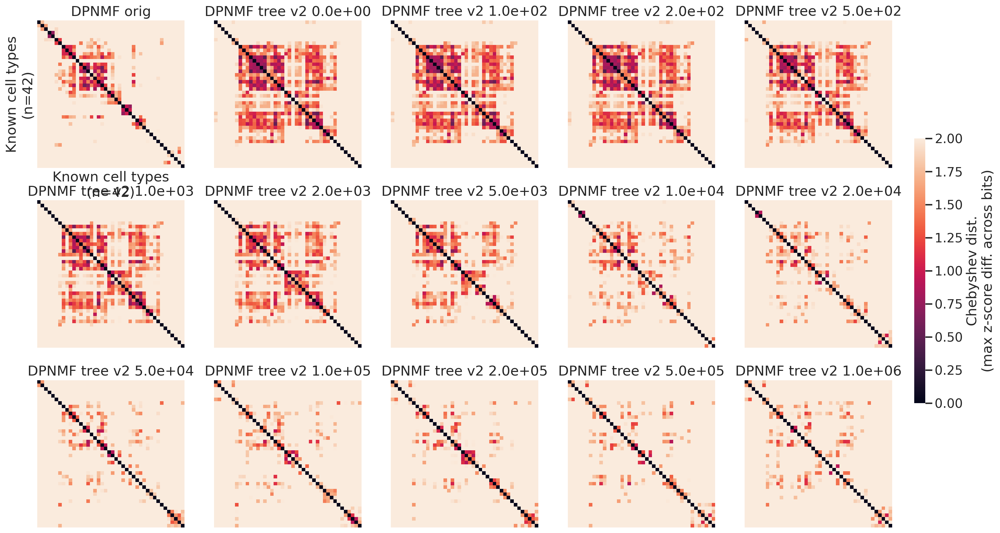

In [29]:
n = len(methods)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(nx*4,ny*4))
cbar_ax = fig.add_axes([0.92, 0.3, 0.01, 0.4])
for i, meth in enumerate(methods):
    ax = axs.flat[i]
    if i == 0: 
        label = True
    else: 
        label = False
        
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
    distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    designu.plot_heatcorr(
        # embx_clsts_corr, 
        # embx_clsts_corr[_rows_l3clsts,:][:,_rows_l3clsts], 
        distmat,
        vmin=0, 
        vmax=2,
        title=meth, 
        ax=ax,
        cbar_ax=cbar_ax,
        label=label,
        cmap='rocket',
        metric_label='Chebyshev dist.\n(max z-score diff. across bits)')

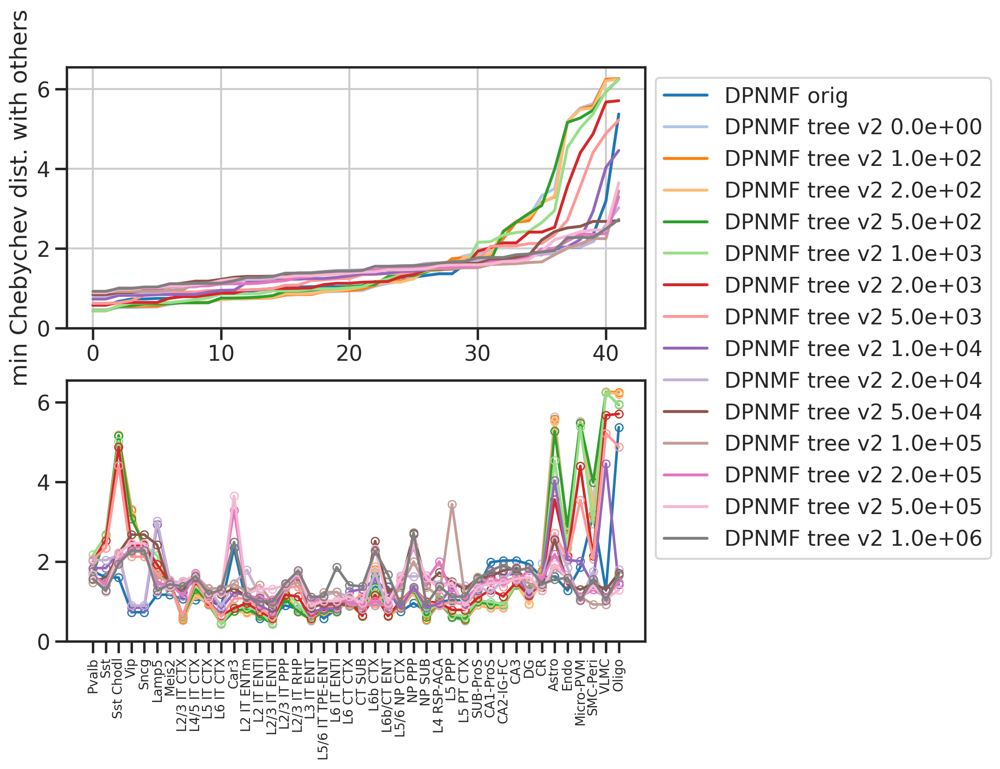

In [30]:
fig, axs = plt.subplots(2,1,figsize=(1*8,2*4))
for i, meth in enumerate(methods):
    fpmat, prjx, prjx_clsts, embx_clsts, embx_clsts_z, embx_clsts_corr, _rows, _cols, _dcols = all_res[meth] 
    dists_cheb = pairwise_distances(embx_clsts_z, metric='chebyshev') # max across bits (Linf norm)
    distmat = dists_cheb[_rows_l3clsts,:][:,_rows_l3clsts]
    
    # corr mat
    ax = axs[0]
    ax.plot(np.sort(np.sort(distmat, axis=0)[1]), label=meth, color=colors[i])
    
    ax = axs[1]
    ax.plot(np.sort(distmat, axis=0)[1], '-o', label=meth, markersize=6, linewidth=2, fillstyle='none', color=colors[i])
    ax.set_xticks(np.arange(len(distmat)))
    ax.set_xticklabels(l3clst_order, rotation=90, fontsize=10)
    ax.grid(False)
    
axs[0].set_ylim(ymin=0)
axs[1].set_ylim(ymin=0)
axs[0].legend(bbox_to_anchor=(1,1))
axs[0].set_ylabel('min Chebychev dist. with others')
# axs[1].set_ylabel('min Chebychev dist. with others')
plt.show()